# 1. Introduction

In clinical toxicology, the swift and accurate detection of toxic alcohols and related substances have crucial for effective patient management and treatment (1,2). This dataset encompasses laboratory measurements and clinical data from 260 tests conducted on 158 patients was suspected of toxic alcohol ingestion. It includes information on clinical interventions such as the use of activated charcoal, antidotal therapies (ethanol, fomepizole), and hemodialysis, used to manage toxic alcohol poisoning. This comprehensive dataset facilitates the analysis of laboratory values in the context of toxic ingestions and provides insights into clinical treatment patterns and outcomes. It serves as a valuable resource for researchers and clinicians aiming to improve diagnostic and therapeutic strategies in managing toxic alcohol exposures. The dataset  have  include extensive clinical and laboratory parameters, such as patient demographics (age, birth sex, location at testing), clinical histories of ingestions, and a wide range of serum/plasma laboratory values (2). 

Specific laboratory data points include sodium, glucose, blood urea nitrogen, ethanol by enzymatic assay, measured osmolality, osmolal gap (corrected/no corrected ethanol), and concentrations of various alcohols and glycols determined by GC or enzymatic assays. Laboratory analyses have performed using Roche Diagnostics clinical chemistry analyzers, including enzymatic assays for substances like ethanol and ethylene glycol. Gas chromatography (GC) have also used to detect acetone, ethanol, ethylene glycol, isopropanol, methanol, and propylene glycol (2).

**Methanol poisoning** is characterized by the accumulation of toxic metabolites such as glycolic acid, oxalic acid and formic acid. While these metabolites can cause high anion gap metabolic acidosis, they also lead to high osmolal gap ( 3). **Ethylene glycol** poisoning is associated with the accumulation of metabolites such as glycolate and oxalate. While these metabolites trigger high anion gap metabolic acidosis, it can cause high osmolal gap (4). **Propylene glycol** has been identified as a toxic agent that can be associated with high anion gap and high osmolal gap, especially when consumed in large quantities (5). **Isopropanol** poisoning can cause high osmolality, but does not lead to anion gap metabolic acidosis ( 6). **Acetone** poisoning is usually associated with a high osmolal gap and a normal or slightly increased anion gap. Acetone contains acetone, a ketone that does not cause metabolic acidosis. Therefore, in the case of acetone poisoning, a high osmolal gap is often observed, while a pronounced increase in anion gap is usually not found (7). 

In the case of poisoning with these types of alcohol, high anion gap metabolic acidosis and high osmolal gap are important indicators reflecting the severity of the disease. Therefore, it is vital that these parameters are taken into account during the diagnosis and treatment process, and the evaluation of anion gap and osmolal gap plays a critical role in understanding the patient's condition and determining the appropriate treatment. The management of alcohol poisoning varies depending on the clinical condition of the patient and the type of alcohol. Treatment usually involves removing toxins through methods such as hemodialysis, while drugs that inhibit alcohol dehydrogenase, such as fomepizole or ethanol, can also be used (4).

In this study, preprocessing steps were initially applied to the relevant data. Then, dimensionality reduction techniques were applied, followed by KMeans clustering, and the dimensionality reduction method that provided the most suitable category distinction was selected. Additionally, hierarchical clustering was applied to the relevant data. In the classification stage, Decision Tree and Random Forest methods were employed, and the validation of these methods and the generated models was conducted. In the association analysis stage, features that could be related were identified, and frequent itemsets were first determined, followed by the creation of association rules. Finally, in the Regression stage, features that were most correlated with each other were selected, and linear regression and polynomial regression methods were applied.

## Read the File

First of all, the data was read using the **read_excel** function. Then, in order to work more efficiently on the data, the column names were updated with shorter and clearer versions.

In [2]:
import pandas as pd
import numpy as np

# read the .xlsx file with read_excel function
DM_data = pd.read_excel('DM_Datasets.xlsx')

# update the column names 
DM_data.columns = ['Patient', 'Category', 'Patient location', 'Age', 'Sex', 'Sodium', 'Glucose', 'Blood urea nitrogen',
       'Ethanol by enzymatic assay', 'Measured osmolality', 'OG(no ethanol correction)', 'OG(ethanol correction)',
       'Estimated osmolal contribution', 'Methanol', 'Isopropanol', 'Ethanol', 'Acetone', 'Ethylene glycol', 
       'Propylene glycol', 'Anion Gap', 'Anion > 16', 'Initial level during admission?', 'Clinical History', 'Death',
       'Intravenous ethanol', 'Fomepizole', 'Dialysis', 'Activated charcoal', 'Estimated timing from ingestion to blood draw']
DM_data.head() #display the first 5 rows in data

,Patient,Category,Patient location,Age,Sex,Sodium,Glucose,Blood urea nitrogen,Ethanol by enzymatic assay,Measured osmolality,...,Anion Gap,Anion > 16,Initial level during admission?,Clinical History,Death,Intravenous ethanol,Fomepizole,Dialysis,Activated charcoal,Estimated timing from ingestion to blood draw
0,1,Acetone,Inpatient,34.7,F,143,141,4,0,350.000000,...,Not available,Unknown,Yes,Ethanol withdrawal,No,No,No,No,No,3 days
1,2,Acetone,Emergency Department,32.7,M,135,109,86,0,328.000000,...,45,Yes,Yes,"Diabetic ketoacidosis, rhabdomyolysis, and acu...",No,No,No,Yes,No,Unknown
2,3,Acetone,Inpatient,46.0,M,136,103,5,0,291.816667,...,Not available,Unknown,Yes,Alcoholic ketoacidosis,No,No,No,No,No,48 hours
3,4,Acetone,Emergency Department,39.1,M,144,102,7,0,333.000000,...,Not available,Unknown,Yes,Unknown,No,No,No,No,No,Unknown
4,5,Acetone,Emergency Department,52.0,M,142,193,15,0,318.000000,...,41,Yes,Yes,Possible isopropanol ingestion,No,No,No,No,No,Unknown


At this stage, firstly, using the "replace function", the values **"Not performed"**, **"Unknown"**, and **"Not available"** were replaced with **NaN**. Then, using the **pd.to_numeric** function, the values in the **'Anion Gap'** column was converted to numeric. This process was replace non-numeric values with NaN. Finally, using the **fillna** function, NaN values  were filled with the mean of each numerical column. This helps reduce data loss by replacing missing values with average values.

In [3]:
DM_data.replace("Not performed", np.nan, inplace = True) # Replaces the value "Not performed" with NaN in 'DM_data'.
DM_data.replace("Unknown", np.nan, inplace = True) # Replaces the value "Unknown" with NaN in 'DM_data'.
DM_data.replace("Not available", np.nan, inplace = True) # Replaces the value "Not available" with NaN in 'DM_data'.

# Converts the 'Anion Gap' column in the DataFrame 'DM_data' to numeric values.
# Any non-numeric values will be replaced with NaN.
DM_data['Anion Gap'] = pd.to_numeric(DM_data['Anion Gap'], errors='coerce')

# Fills NaN values in the 'DM_data' with the mean of each numeric column.
# DM_data_ful: Raw data (no preprocessing)
DM_data_ful = DM_data.fillna(DM_data.mean(numeric_only=True)) 
DM_data_ful.head() # Display the first 5 rows the DM_data_ful

,Patient,Category,Patient location,Age,Sex,Sodium,Glucose,Blood urea nitrogen,Ethanol by enzymatic assay,Measured osmolality,...,Anion Gap,Anion > 16,Initial level during admission?,Clinical History,Death,Intravenous ethanol,Fomepizole,Dialysis,Activated charcoal,Estimated timing from ingestion to blood draw
0,1,Acetone,Inpatient,34.7,F,143,141,4,0,350.000000,...,18.644444,NaN,Yes,Ethanol withdrawal,No,No,No,No,No,3 days
1,2,Acetone,Emergency Department,32.7,M,135,109,86,0,328.000000,...,45.000000,Yes,Yes,"Diabetic ketoacidosis, rhabdomyolysis, and acu...",No,No,No,Yes,No,NaN
2,3,Acetone,Inpatient,46.0,M,136,103,5,0,291.816667,...,18.644444,NaN,Yes,Alcoholic ketoacidosis,No,No,No,No,No,48 hours
3,4,Acetone,Emergency Department,39.1,M,144,102,7,0,333.000000,...,18.644444,NaN,Yes,NaN,No,No,No,No,No,NaN
4,5,Acetone,Emergency Department,52.0,M,142,193,15,0,318.000000,...,41.000000,Yes,Yes,Possible isopropanol ingestion,No,No,No,No,No,NaN


At this stage, the aim was to visualize the relationship between the **osmolal gap (with ethanol correction)** and **anion gap** characteristics of toxic substances. Firstly, unique categories from the 'Category' column in the dataset was extracted. Subsequently, groups were formed based on these categories, and a scatter plot have generated for each category group, displaying the 'OG (ethanol correction)' and 'Anion Gap' values.

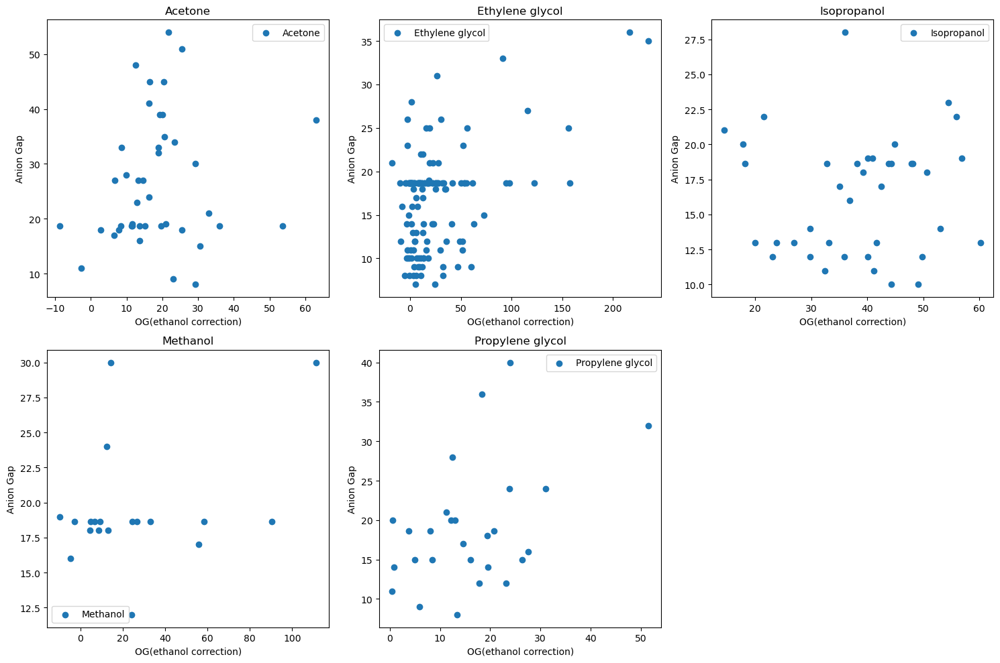

In [4]:
import matplotlib.pyplot as plt

# Get unique categories from the 'Category' column
categories = DM_data_ful['Category'].unique()

# Create a subplot layout with 2 rows and 3 columns
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Iterate over the categories and their respective data groups
# Place the data in the subplots, considering the last empty plot
for ax, (name, group) in zip(axes.flatten(), DM_data_ful.groupby('Category')):
    # Scatter plot for each category group
    ax.scatter(group['OG(ethanol correction)'], group['Anion Gap'], label=name)
    ax.set_xlabel("OG(ethanol correction)")
    ax.set_ylabel("Anion Gap")
    ax.legend()
    ax.set_title(name)

# Remove the empty last subplot
for i in range(len(categories), len(axes.flatten())):
    fig.delaxes(axes.flatten()[i])

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

# 2. Data Preprocessing

### Normalization MinMaxScaler()

In the initial step of data preprocessing, **MinMaxScaler()** was used to scale the values in the relevant columns to a specific range [0,1] (8). Normalizing input data was particularly crucial in machine learning models because having features at different scales could lead the model to learn incorrectly and result in decreased performance. This scaling ensure that all features are on a similar scale, preventing any particular feature from dominating the learning process and potentially skewing the model's predictions (9).

In [5]:
# Import preprocessing module from scikit-learn
from sklearn import preprocessing

# Create the normalizer (MinMaxScaler)
scaler = preprocessing.MinMaxScaler()

# Create a copy of the original data to preserve it
DM_normalization = DM_data_ful.copy()

# Preprocess the features: Age, OG(ethanol correction), Methanol, Isopropanol, Ethanol,
# Acetone, Ethylene glycol, Propylene glycol, and Anion Gap
DM_normalization[['Age','OG(ethanol correction)', 'Methanol','Isopropanol' , 'Ethanol',
                  'Acetone','Ethylene glycol','Propylene glycol','Anion Gap']] = scaler.fit_transform(
                      DM_data_ful[['Age','OG(ethanol correction)', 'Methanol','Isopropanol' ,
                                   'Ethanol','Acetone','Ethylene glycol','Propylene glycol','Anion Gap']])

# Display the first 5 rows the DM_normalization with normalize columns
DM_normalization.head() 

,Patient,Category,Patient location,Age,Sex,Sodium,Glucose,Blood urea nitrogen,Ethanol by enzymatic assay,Measured osmolality,...,Anion Gap,Anion > 16,Initial level during admission?,Clinical History,Death,Intravenous ethanol,Fomepizole,Dialysis,Activated charcoal,Estimated timing from ingestion to blood draw
0,1,Acetone,Inpatient,0.444299,F,143,141,4,0,350.000000,...,0.247754,NaN,Yes,Ethanol withdrawal,No,No,No,No,No,3 days
1,2,Acetone,Emergency Department,0.418087,M,135,109,86,0,328.000000,...,0.808511,Yes,Yes,"Diabetic ketoacidosis, rhabdomyolysis, and acu...",No,No,No,Yes,No,NaN
2,3,Acetone,Inpatient,0.592398,M,136,103,5,0,291.816667,...,0.247754,NaN,Yes,Alcoholic ketoacidosis,No,No,No,No,No,48 hours
3,4,Acetone,Emergency Department,0.501966,M,144,102,7,0,333.000000,...,0.247754,NaN,Yes,NaN,No,No,No,No,No,NaN
4,5,Acetone,Emergency Department,0.671035,M,142,193,15,0,318.000000,...,0.723404,Yes,Yes,Possible isopropanol ingestion,No,No,No,No,No,NaN


### OrdinalEncoder()

At this stage, **OrdinalEncoder()** was used to transform categorical features into numerical values. Through this transformation, each categorical feature was assigned a different numerical value, enabling it to be processed by machine learning models. The **fit_transform** applies the transformation process to the specified categorical features in the dataframe and places the results into the respective columns in the original dataframe (10).

In [6]:
# Create the encoder (OrdinalEncoder)
ordinal_encoder = preprocessing.OrdinalEncoder()

# Preprocess the categorical features: Patient location, Sex, Initial level during admission?,
# Death, Intravenous ethanol, Fomepizole, Dialysis, Activated charcoal
DM_normalization[['Patient location',
                  'Sex',
                  'Initial level during admission?',
                  'Death',
                  'Intravenous ethanol',
                  'Fomepizole',
                  'Dialysis',
                  'Activated charcoal']] = ordinal_encoder.fit_transform(
                      DM_normalization[['Patient location',
                                        'Sex',
                                        'Initial level during admission?',
                                        'Death',
                                        'Intravenous ethanol',
                                        'Fomepizole',
                                        'Dialysis',
                                        'Activated charcoal']])

# Display the first 5 rows the DM_normalization with encode columns
DM_normalization.head() 

,Patient,Category,Patient location,Age,Sex,Sodium,Glucose,Blood urea nitrogen,Ethanol by enzymatic assay,Measured osmolality,...,Anion Gap,Anion > 16,Initial level during admission?,Clinical History,Death,Intravenous ethanol,Fomepizole,Dialysis,Activated charcoal,Estimated timing from ingestion to blood draw
0,1,Acetone,1.0,0.444299,0.0,143,141,4,0,350.000000,...,0.247754,NaN,1.0,Ethanol withdrawal,0.0,0.0,0.0,0.0,0.0,3 days
1,2,Acetone,0.0,0.418087,1.0,135,109,86,0,328.000000,...,0.808511,Yes,1.0,"Diabetic ketoacidosis, rhabdomyolysis, and acu...",0.0,0.0,0.0,1.0,0.0,NaN
2,3,Acetone,1.0,0.592398,1.0,136,103,5,0,291.816667,...,0.247754,NaN,1.0,Alcoholic ketoacidosis,0.0,0.0,0.0,0.0,0.0,48 hours
3,4,Acetone,0.0,0.501966,1.0,144,102,7,0,333.000000,...,0.247754,NaN,1.0,NaN,0.0,0.0,0.0,0.0,0.0,NaN
4,5,Acetone,0.0,0.671035,1.0,142,193,15,0,318.000000,...,0.723404,Yes,1.0,Possible isopropanol ingestion,0.0,0.0,0.0,0.0,0.0,NaN


At this stage, column names that will not be used for dimension reduction was assigned to the **drop_columns list**. Then, the drop function removes the relevant columns from the original dataframe, and the result was saved to the **dim_reduce_data** dataframe.

In [7]:
# Define the columns to be dropped from the dataframe
drop_columns = ['Patient',
                'Category',
                'Sodium',
                'Glucose',
                'Blood urea nitrogen',
                'Ethanol by enzymatic assay',
                'Measured osmolality',
                'OG(no ethanol correction)',
                'Estimated osmolal contribution',
                'Clinical History',
                'Estimated timing from ingestion to blood draw',
                'Anion > 16']

# Remove the specified columns from the dataframe so it only contains the features needed for our model
dim_reduce_data = DM_normalization.drop(columns=drop_columns)

# Display the first 5 rows the dim_reduce_data
dim_reduce_data.head()

,Patient location,Age,Sex,OG(ethanol correction),Methanol,Isopropanol,Ethanol,Acetone,Ethylene glycol,Propylene glycol,Anion Gap,Initial level during admission?,Death,Intravenous ethanol,Fomepizole,Dialysis,Activated charcoal
0,1.0,0.444299,0.0,0.282001,0.0,0.0,0.0,0.776952,0.000000,0.062626,0.247754,1.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.418087,1.0,0.150352,0.0,0.0,0.0,0.148699,0.000000,0.080210,0.808511,1.0,0.0,0.0,0.0,1.0,0.0
2,1.0,0.592398,1.0,0.115217,0.0,0.0,0.0,0.156134,0.000000,0.000000,0.247754,1.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.501966,1.0,0.212378,0.0,0.0,0.0,0.628253,0.060828,0.080210,0.247754,1.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.671035,1.0,0.134472,0.0,0.0,0.0,0.267658,0.000000,0.000000,0.723404,1.0,0.0,0.0,0.0,0.0,0.0


# 3. Clustering

## Dimensionality Reduction and Clustering with KMeans

**Dimensionality reduction** is critical, especially when working with large datasets, for better understanding the structure of the data, visualizing it, and conducting faster and more efficient analyses (8). In this study, the aim was to create a dataframe containing the most significant numerical columns and then apply PCA, t-SNE, and UMAP dimensionality reduction methods to this dataframe to achieve the most meaningful separation for clustering. The KMeans clustering results based on PCA, t-SNE, and UMAP methods each reveal different characteristics of the dataset and visualize the results in different ways.

###  Principal Component Analysis (PCA)

PCA is a statistical method used to analyze data tables where observations are characterized by multiple correlated quantitative variables. Its aim is to distill crucial information from the data, creating a set of new uncorrelated variables known as principal components. These components are then utilized to represent the patterns of similarity among observations and variables on maps or plots (11).

In [8]:
from sklearn.decomposition import PCA

# Create a PCA object with the number of components set to 2
pca = PCA(n_components=2)

# Fit the PCA on the reduced data and transform it to the principal components
DM_data_scaled_pca = pca.fit_transform(dim_reduce_data)

# Convert the principal components into a DataFrame
principal_df = pd.DataFrame(data = DM_data_scaled_pca, columns = ['PC1', 'PC2'])

# Print the shape of the resulting DataFrame to see the dimensions
print(principal_df.shape)

# Display the first few rows of the DataFrame containing the principal components
principal_df.head()

(260, 2)


,PC1,PC2
0,-0.040633,0.763510
1,0.792101,-0.336886
2,0.011015,-0.249579
3,0.531139,-0.293857
4,0.561028,-0.341837


### KMeans with PCA

The resulting **PCA** graph was visualize the data by projecting it onto two principal components (PC1-PC2: linear combinations that explain the most variance in the data). In the PCA graph, the clusters shown in different colors (blue, green, red, purple, and brown) exhibit some separation, but the boundaries between the clusters are quite unclear, and some clusters overlap with each other. This indicates that PCA does not sufficiently distinguish between clusters and fails to fully capture the complexity of the data structure.

Text(0, 0.5, 'PC2')

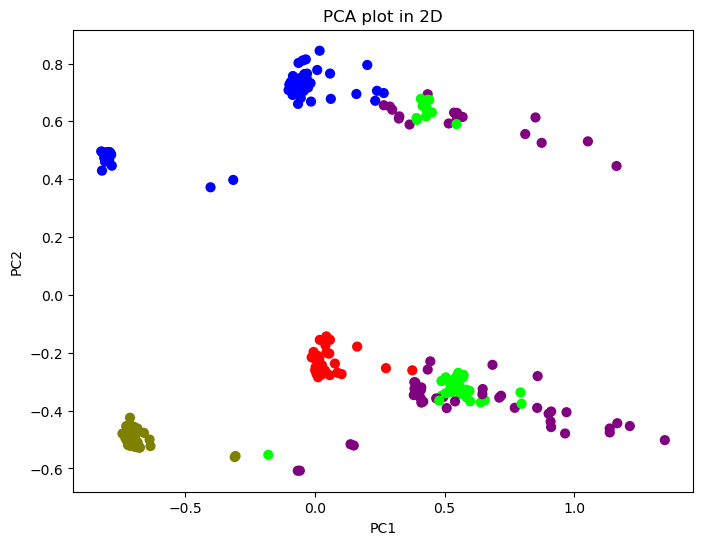

In [9]:
#Import KMeans from scikit-learn
from sklearn.cluster import KMeans

# Create a KMeans object with the number of clusters set to 5, 15 initializations, and 500 max iterations
kmeans = KMeans(n_clusters=5, n_init=15, max_iter=500, random_state=0)

# Train the KMeans model on the reduced data and make cluster predictions
clusters = kmeans.fit_predict(dim_reduce_data)

# Set the figure size for the plot
plt.figure(figsize=(8,6))

# Create a scatter plot of the first two principal components, colored by cluster assignment
plt.scatter(principal_df.iloc[:,0], principal_df.iloc[:,1], c=clusters, cmap="brg", s=40)

# Add title and axis labels to the plot
plt.title('PCA plot in 2D')
plt.xlabel('PC1')
plt.ylabel('PC2')

###  t-distributed stochastic neighbor embedding (t-SNE)

The process extracts nonlinear similarity features from spectra to reduce them into a lower-dimensional space. The two-dimensional data produced by t-SNE demonstrated superior visualization and significantly enhanced clustering quality compared to Principal Component Analysis (PCA) (12). t-SNE aims to preserve local relationships between data points while reducing high-dimensional data to a low-dimensional space (13).

In [10]:
# Import the t-SNE module from sklearn.manifold
from sklearn.manifold import TSNE

# Create a t-SNE object with n_components=2 to reduce to 2 dimensions
tsne = TSNE(n_components=2)

# Apply the t-SNE algorithm to our dataset and assign the results to X_tsne
# dim_reduce_data is our dataset to be reduced in dimensions
X_tsne = tsne.fit_transform(dim_reduce_data)

# Convert the resulting t-SNE output to a DataFrame
# Name the DataFrame columns 'tsne comp. 1' and 'tsne comp. 2'
tsne_df = pd.DataFrame(data = X_tsne, columns = ['tsne comp. 1', 'tsne comp. 2'])

# Print the shape (number of rows and columns) of the DataFrame
print(tsne_df.shape)

# Display the first 5 rows of the DataFrame
tsne_df.head()

(260, 2)


,tsne comp. 1,tsne comp. 2
0,-3.444637,9.722782
1,10.957316,6.811662
2,9.410310,-3.573699
3,10.791901,10.487319
4,10.941422,8.790895


### KMeans with t-SNE

In the t-SNE graph, clusters shown in different colors were quite distinctly separated. The blue, green, red, and dark green clusters were separated by clear boundaries, although some overlaps were observed among the purple clusters. Overall, t-SNE provides better separation compared to PCA and better reflects the relationships between clusters.

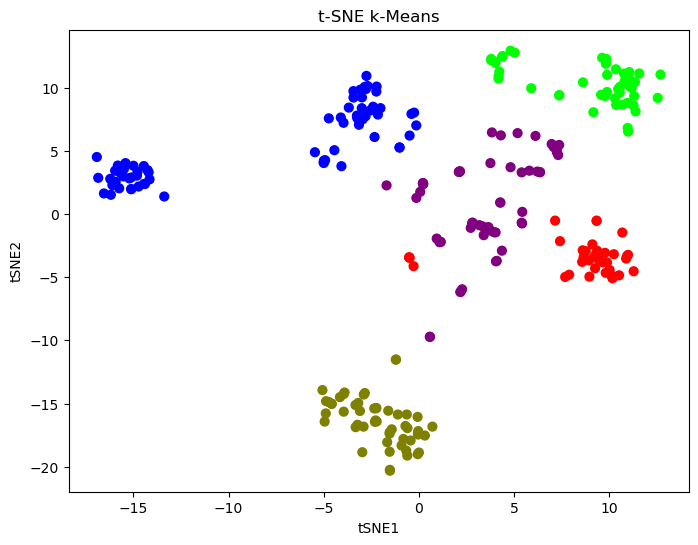

In [11]:
# Create a KMeans object with 5 clusters, 15 initializations, 500 maximum iterations, and a random state for reproducibility
kmeans = KMeans(n_clusters=5, n_init=15, max_iter=500, random_state=0)

# Train the KMeans algorithm on the dataset and predict cluster assignments
clusters = kmeans.fit_predict(dim_reduce_data)

# Set the size of the figure
plt.figure(figsize=(8,6))

# Create a scatter plot of the t-SNE results, colored by the cluster assignments
plt.scatter(tsne_df.iloc[:,0], tsne_df.iloc[:,1], c=clusters, cmap="brg", s=40)

# If you have centroids to plot, you can use the following line (currently commented out)
# plt.scatter(x=centroids_pca[:,0], y=centroids_pca[:,1], marker="x", s=500, linewidths=3, color="black")

# Add titles and labels to the plot for aesthetics
plt.title('t-SNE k-Means')
plt.xlabel('tSNE1')
plt.ylabel('tSNE2')

# Show the plot
plt.show()

### Uniform Manifold Approximation and Projection for Dimension Reduction (UMAP)

UMAP  stands out as a cutting-edge method for dimensionality reduction. Notably, UMAP competes with t-SNE in terms of visualization quality while potentially preserving more global structure and boasting superior runtime performance. Additionally, UMAP imposes no computational constraints on embedding dimension, positioning it as a versatile dimensionality reduction tool for machine learning tasks (14).

In [12]:
# Import the UMAP module from umap
import umap

# Create a UMAP object
um = umap.UMAP()

# Fit the UMAP model to the dataset
X_fit = um.fit(dim_reduce_data)  # We'll use X_fit later

# Transform the dataset using the fitted UMAP model
X_umap = um.transform(dim_reduce_data)

# Convert the UMAP results to a DataFrame
# Name the DataFrame columns 'umap comp. 1' and 'umap comp. 2'
umap_df = pd.DataFrame(data = X_umap, columns = ['umap comp. 1', 'umap comp. 2'])

# Print the shape (number of rows and columns) of the DataFrame
print(umap_df.shape)

# Display the first 5 rows of the DataFrame
umap_df.head()

(260, 2)


,umap comp. 1,umap comp. 2
0,9.659447,12.727158
1,15.495067,16.038883
2,13.729320,12.160666
3,15.769721,17.416924
4,15.412345,16.455023


### KMeans with UMAP

UMAP reduces high-dimensional data to a low-dimensional space while preserving the overall structure between data points. In the UMAP graph, clusters shown in different colors are quite well-separated. The blue, green, red, and dark green clusters are distinct with clear boundaries, while some overlaps are observed among the purple clusters. Similar to t-SNE, UMAP effectively reflects the clustering structure of the data and provides slightly clearer distinctions compared to t-SNE.

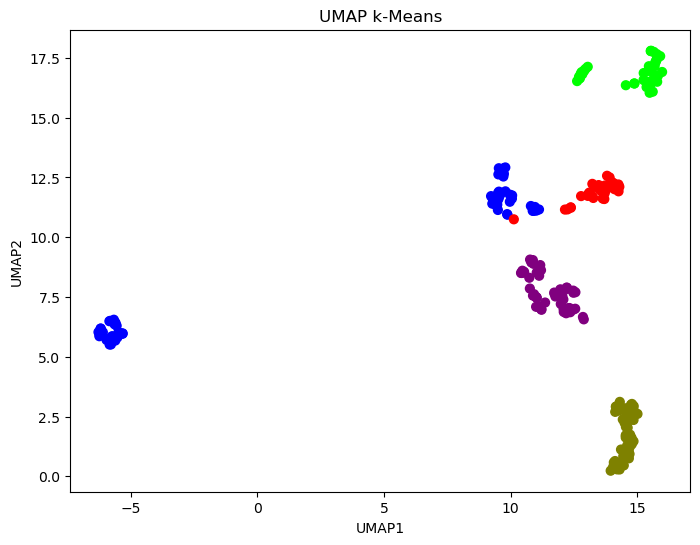

In [13]:
# Create a KMeans object with 5 clusters, 15 initializations, 500 maximum iterations, and a random state for reproducibility
kmeans = KMeans(n_clusters=5, n_init=15, max_iter=500, random_state=0)

# Train the KMeans algorithm on the dataset and predict cluster assignments
clusters = kmeans.fit_predict(dim_reduce_data)

# Set the size of the figure
plt.figure(figsize=(8,6))

# Create a scatter plot of the UMAP results, colored by the cluster assignments
plt.scatter(umap_df.iloc[:,0], umap_df.iloc[:,1], c=clusters, cmap="brg", s=40)

# Add titles and labels to the plot for aesthetics
plt.title('UMAP k-Means')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')

# Show the plot
plt.show()

t-SNE and UMAP provide better results in visualizing complex data structures and distinguishing between clusters compared to PCA. While PCA summarizes the variance in the dataset across two components, t-SNE and UMAP better preserve local and global relationships between data points. 

In conclusion, the clustering result with PCA shows that the distinction between clusters is not clear and there are many overlaps. The t-SNE clustering result with t-SNE shows a better distinction between clusters compared to PCA, but some overlaps are observed in the purple clusters. The clustering result with UMAP, on the other hand, shows a very clear distinction between clusters and better reflects the structure of the clusters. Clustering with UMAP was provide a clearer distinction for **5 separate categories** than other methods.

### 3D Scatter Plot with plotly (UMAP)

It was concluded that UMAP provided the best separation in clustering compared to PCA and t-SNE. At this stage, the UMAP algorithm was use to reduce the dimensions of the dataset to three dimensions. Then, using the **Plotly Express** library, a **3D scatter plot** with clustering was created.

In [14]:
# Import the Plotly Express module
import plotly.express as px

# Create a UMAP object with n_components=3 for 3D scatter plot
um = umap.UMAP(n_components=3)

# Fit and transform the dataset using UMAP
components_umap = um.fit_transform(dim_reduce_data)

# Create a 3D scatter plot using Plotly Express
fig = px.scatter_3d(
    components_umap, x=0, y=1, z=2, color=clusters, size=0.1*np.ones(len(dim_reduce_data)), opacity=1,
    title='UMAP plot in 3D',
    labels={'0': 'x', '1': 'y', '2': 'z'},
    width=650, height=500
)

# Display the plot
fig.show()

In [32]:
components_umap

array([[ 1.11297884e+01,  7.75959253e+00,  2.29523396e+00],
       [ 5.41727781e+00,  6.38778353e+00,  8.18429515e-02],
       [ 1.10089722e+01,  9.03783989e+00,  6.50744390e+00],
       [ 5.00866604e+00,  6.08977699e+00, -7.23397851e-01],
       [ 5.29995489e+00,  6.52346420e+00, -2.57294118e-01],
       [ 4.99425554e+00,  6.01209307e+00, -8.06138396e-01],
       [ 5.10476780e+00,  6.31949520e+00, -4.75184679e-01],
       [ 4.97301817e+00,  6.00335264e+00, -6.70083106e-01],
       [ 1.09080305e+01,  9.42374229e+00,  6.70713902e+00],
       [ 5.29699469e+00,  6.05521965e+00, -3.30643594e-01],
       [ 1.09848557e+01,  9.35476589e+00,  6.65618849e+00],
       [ 5.76148367e+00,  6.59148359e+00, -1.42604709e-01],
       [ 1.08000021e+01,  9.31555748e+00,  6.92614651e+00],
       [ 1.03239937e+01,  7.50704670e+00,  3.40033507e+00],
       [ 8.60325813e+00,  6.34872580e+00,  4.21930361e+00],
       [ 7.72018003e+00,  7.40974951e+00, -1.70015529e-01],
       [ 1.05461559e+01,  7.00032854e+00

## Hierarchical Clustering

Hierarchical clustering is a technique employed to categorize akin instances within a dataset. Initially, each instance is assigned to its own cluster. By utilizing similarity or distance metrics, instances are amalgamated or segregated to create clusters (15). In the agglomerative approach, each instance is initially treated as an individual cluster, and akin instances are amalgamated to foster clustering (16). Conversely, in the divisive approach, all instances are encompassed within a singular cluster, and disparate instances are partitioned to conduct clustering. This procedure yields a clustering tree or dendrogram, facilitating the exploration of inherent cluster configurations within the dataset .

At this stage, linkage() was create a clustering structure based on the given UMAP dimensions (umap comp. 1 and umap comp. 2) using the 'average' linkage method. A dendrogram was then plotted to visualize the clustering structure. The dendrogram visually was represent the clustering structure, showing the merging sequence and distance relationships of each data point. It includes category information as labels on the x-axis.

### Dendrogram with UMAP

The resulting dendrogram contains the category names on the x-axis and the distance parameter between the categories on the y-axis. Dec. The dendrogram was divided into six main clusters. The dark blue and dark green group on the far right contains ethylene glycol with a high density. Although these two groups contain ethylene glycol intensively, the presence of such a distinction indicates that the relevant data (on the left side) may have less toxic properties.

The black group contains mostly propylene glycol, so could think that it represents this group well. The amount of acetone and isopropanol is quite high in the yellow group, where these two groups are quite well represented; however, a clear distinction could not be made because isopropanol converts to acetone over time. The situation in question here also applies to the pink group. Although the turquoise group contains a fairly large amount of ethylene glycol, it was understood from the methylene samples found in this group that this cluster represents the methylene class, and ethylene glycol samples with more and less toxic values are also grouped here.

Although a small number of examples from different categories was grouped within each cluster, the expected groups are in a compact structure that are quite clearly separated. According to the obtained dendrogram, the grouping of different alcohol categories was displayed quite clearly.

The ward method was preferred in this dendrogram is a popular hierarchical clustering technique that aims to minimize the total intra-cluster variance in clustering analysis. At each step, it combines the pair of clusters that will cause the least increase in intra-cluster variance after the merger. This approach usually creates clusters that are clearly separated from each other and are approximately equal in size. When used in combination with the Euclidean distance metric, the Ward method selects the pairs with the lowest intra-cluster variance, which allows obtaining clusters with better separated and obvious boundaries during the clustering process. Therefore, the dendrogram created when using the Ward method offers more clearly separated sets, which makes it easier to interpret and analyze the results (17, 18).

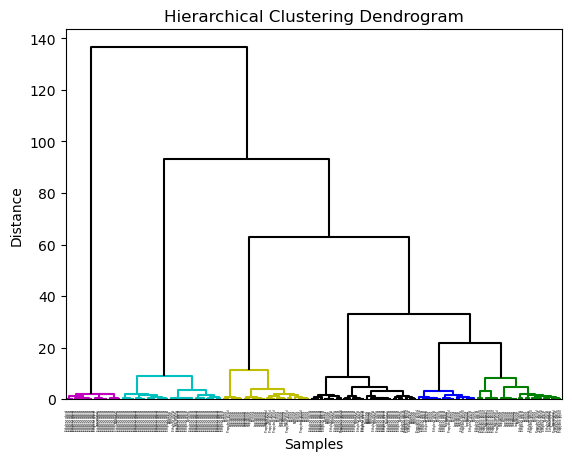

In [15]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import set_link_color_palette

# Assuming umap_df and DM_normalization are already defined and loaded
# Create the hierarchical clustering using the 'ward' linkage method
Z = linkage(umap_df[['umap comp. 1', 'umap comp. 2']], method='ward', metric='euclidean')

# Set a custom color palette
set_link_color_palette(['m', 'c', 'y', 'k', 'b', 'g', 'r'])

# Calculate the color threshold to differentiate more clusters
color_threshold = Z[-5, 2]

# Plot the dendrogram
dendro = dendrogram(
    Z,
    labels=list(DM_normalization['Category']),
    color_threshold=color_threshold,
    above_threshold_color='black'  # Color for the links above the threshold
)

# Set the title and axis labels
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Samples')
plt.ylabel('Distance')

# Adjust the font size of x-axis labels
plt.xticks(fontsize=2, rotation=90)

# Save the plot with DPI set to 300
plt.savefig('HC_UMAP.png', dpi=300)

# Show the plot
plt.show()


### Truncate the Dendrogram

The dendrogram was obtained at this stage refers to the number of samples found in clusters and their distribution. While it is thought that the most grouped part could be "Ethylene Glycol" on the right side, it is thought that the group with a closer distance with ethylene glycol is propylene glycol. It was thought that the part grouped on the left side was acetone and Isopropanol. it was thought that the group containing 56 samples might contain methylene with a density of. When this dendrogram  was evaluated by considering the first obtained dendrogram, it could be considered that the result contains a logical distribution.

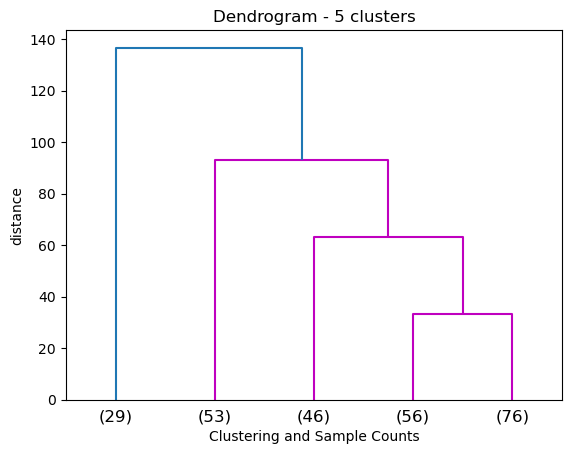

In [16]:
# set the plot title
plt.title('Dendrogram - 5 clusters')

# set the axis labels
plt.xlabel('Clustering and Sample Counts')
plt.ylabel('distance')

# plot the dendrogram
dendrogram(Z, truncate_mode='lastp', p=5) # no labels possible

plt.savefig('HC_COUNT.png', dpi=300)  # Set DPI to 300 (or any desired value)

# show the plot
plt.show()

# 4. Classification

### Decision Tree

**Decision tree classifier** is one of the data classification methods that uses criteria separation and pruning methods that transform complex decision-making problems into simple processes and provide an easier method in terms of interpretation.

A decision tree classifier model was created by selecting the 'Pattient location' column in the data used in this study as the target data. Anion gap and osmolal gap columns were used for model training. In this way, the relationship between anion gap and osmolal gap values ​​and the person's position during the test could be observed. The created decision tree was visualized and analyzed using the **tree.plot_tree** function.

In [17]:
from sklearn import preprocessing
#The column of interest was selected as target to create the decision tree.
data_target = DM_data_ful['Patient location']
#With the label encoding function, the expression in the column was converted to 0 and 1.
label_encoder = preprocessing.LabelEncoder()
data_target_encoded = label_encoder.fit_transform(data_target)

from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier(random_state=42) #create decision tree classifier model
# this model contain information of osmolal and anion gap
dt.fit(DM_normalization[['OG(ethanol correction)',
       'Anion Gap']], data_target_encoded)

import matplotlib.pyplot as plt
from sklearn import tree
# create plot of decision tree
plt.figure(figsize=(200,100))
# tree created with use plot_tree function
tree.plot_tree(dt,
               feature_names=DM_normalization[['OG(ethanol correction)',
       'Anion Gap']].columns.tolist(), 
               class_names=label_encoder.classes_,
              filled = True, 
              rounded=True)
plt.savefig('Decision_Tree.png') 
plt.show()

At the root node of the decision tree, the data was divided into two by using values ​​greater and less than 0.309 of the anion gap value. This node contains all samples, gini index is 0.371. The closer **Gini index** gets to 0, the higher the probability that the samples in the node belong to a single class. There are 196 inpatients and 64 patients in the emergency department in the data. These values ​​are indicated within the node by **value** and **sample**. The **class** value is determined according to the most common value in the data, and when we look at the data in general, it is seen that there are more hospitalized patients in the root node.
There are data with anion gap values ​​greater than 0.309 on the right side of the decision tree, and smaller data on the left side. If the osmolal gap value on the right side is greater than 0.119, it is divided into two classes, where the emergency room is small and the inpatient hospital is more. Looking at this part of the decision tree, when anion gap values ​​and osmolal gap values ​​are large, the number of patients in the emergency department is higher. The analysis of the left side is a little more complicated; in some cases, the classes containing values ​​where both values ​​are high are the same, and sometimes the classes containing values ​​where one value is high and the other is low are the same. In this case, the relationship between osmolal and anion gap is not clearly evident. Differences at this point can be associated with category differences present in the data. When the necessary literature review is made, the osmolal gap initially increases during metabolism in ethylene glycol, but the metabolites that emerge after the conversion reduce the osmolal gap and increase the anion gap value (19). Propylene glycol has high osmolal and anion gap values ​​as a result of lactic acid formed as a result of metabolism (20). Likewise, it was observed that both values ​​were high as a result of methanol digestion (21). In isoproranol poisoning, high osmolality occurs and does not cause metabolic acidosis associated with anion gap (20). In this case, the osmolal gap or anion gap size is shaped according to the effect on the patient's position as well as the information about which alcohol poisoning the patient was exposed to.
These different relationships in different categories were verified by visualizing them with the decision tree. In this way, the decision tree divides the data set according to certain features and the final classification is made. Leaf nodes of the tree contain the final decisions and the number of examples classified according to these decisions.

### Random Forest

Random forest is a technique that randomizes predictors by bootstrapping them to achieve a high degree of prediction accuracy (22).

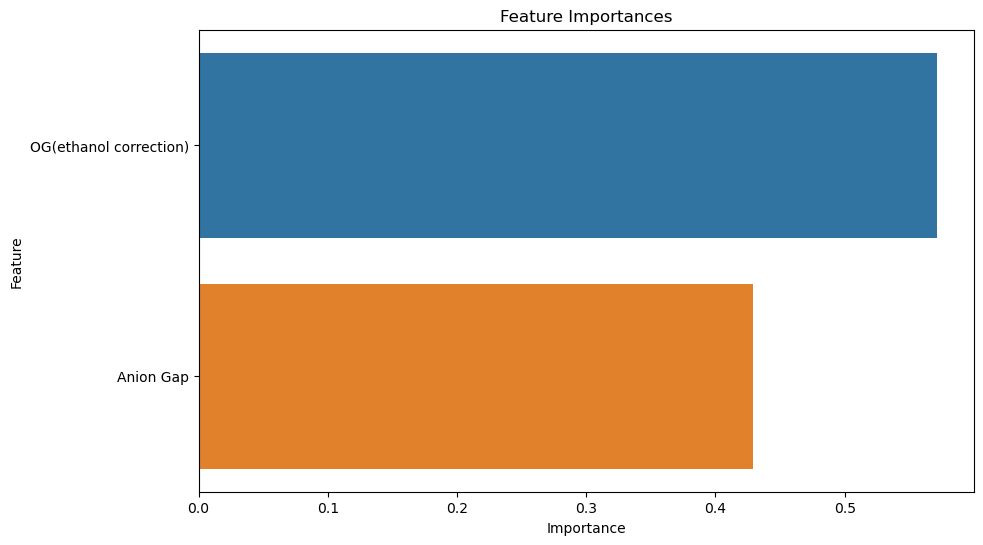

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing

#selected features for random forest model
features = ['OG(ethanol correction)', 'Anion Gap']
X = DM_normalization[features]
y = data_target_encoded

# Create and train the Random Forest model
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X, y)

# Extract feature importance
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]


plt.figure(figsize=(10, 6))
sns.barplot(x=importances[indices], y=np.array(features)[indices])
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

The **RandomForestClassifier** model was created and it was determined which feature the model gave more weight to and which feature was more decisive in the model's predictions. The 'Patient location' column was determined as the target and the anion gap and osmolal gap values ​​were used to determine which value was given more weight. A model containing 100 decision trees was created and trained with the selected features. The features in the trained model were listed from largest to smallest according to their importance and the values ​​were visualized. When the result graph is analyzed, it is seen that the osmolal gap value has a more dominant role in the model predictions.

In [19]:
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import numpy as np

#use cross validation for calculated accuracies
accuracy_data_dt = cross_val_score(dt, X, y, cv=10, scoring='accuracy')
accuracy_data_rf = cross_val_score(rf, X, y, cv=10, scoring='accuracy')

#calculated accuracies for decision tree 
print("Decision Tree Accuracies:")
for i, acc in enumerate(accuracy_data_dt):
    print("Fold {}: Accuracy = {:.2f}%".format(i, acc * 100.0))
print("Average Accuracy for Decision Tree = {:.2f}%".format(accuracy_data_dt.mean() * 100.0))
#calculated accuracies for random forest
print("\nRandom Forest Accuracies:")
for i, acc in enumerate(accuracy_data_rf):
    print("Fold {}: Accuracy = {:.2f}%".format(i, acc * 100.0))
print("Average Accuracy for Random Forest = {:.2f}%".format(accuracy_data_rf.mean() * 100.0))


Decision Tree Accuracies:
Fold 0: Accuracy = 73.08%
Fold 1: Accuracy = 76.92%
Fold 2: Accuracy = 76.92%
Fold 3: Accuracy = 65.38%
Fold 4: Accuracy = 80.77%
Fold 5: Accuracy = 80.77%
Fold 6: Accuracy = 76.92%
Fold 7: Accuracy = 73.08%
Fold 8: Accuracy = 69.23%
Fold 9: Accuracy = 57.69%
Average Accuracy for Decision Tree = 73.08%

Random Forest Accuracies:
Fold 0: Accuracy = 76.92%
Fold 1: Accuracy = 80.77%
Fold 2: Accuracy = 80.77%
Fold 3: Accuracy = 69.23%
Fold 4: Accuracy = 80.77%
Fold 5: Accuracy = 80.77%
Fold 6: Accuracy = 76.92%
Fold 7: Accuracy = 65.38%
Fold 8: Accuracy = 69.23%
Fold 9: Accuracy = 73.08%
Average Accuracy for Random Forest = 75.38%


Accuracy rates were calculated with cross validation for the created decision tree and random forest classification models. A 10-fold cross validation was performed for the models. In the resulting output, the accuracy rates and average accuracy rates of each layer for both models are printed as percentages. When we look at the average accuracy rates, we see values ​​of 73-75%. This accuracy rate is acceptable but improvements can be made.

In [20]:
from sklearn.model_selection import train_test_split
#with train_test_split, train and test data created for data and target data
data_train, data_test, target_train, target_test = train_test_split(
    DM_normalization[['OG(ethanol correction)', 'Anion Gap']], data_target_encoded,test_size=0.2, random_state=42, stratify=data_target)


print("=======TRAIN=========")
display(data_train)
display(target_train)

=======TRAIN=========


,OG(ethanol correction),Anion Gap
232,0.051363,0.191489
63,0.117703,0.247754
252,0.071724,0.085106
49,0.082561,0.021277
192,0.260712,0.247754
...,...,...
242,0.072871,0.148936
244,0.142359,0.617021
151,0.106399,0.042553
67,0.112728,0.319149


array([0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 1])

In [21]:
print("=======TEST=========")
display(data_test)
display(target_test)

=======TEST=========


,OG(ethanol correction),Anion Gap
168,0.076070,0.247754
55,0.087985,0.247754
53,0.527991,0.425532
65,0.032151,0.106383
259,0.161801,0.106383
230,0.121673,0.234043
120,0.078794,0.247754
186,0.247530,0.276596
61,0.319177,0.148936
20,0.185815,0.489362


array([1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 1])

The data set was divided into training and testing sets. The aim here is to divide the data set into smaller pieces to evaluate the performance of the model and to train and test the model using these pieces.
20% of the data set was allocated as the test set, providing a constant seed value for randomness and thus making the splitting process repeatable. Class proportions were counterbalanced according to the distribution of the target variable to be preserved in both the training and testing set.

Accuracy: 0.7692307692307693
Accuracy (excluding True Negatives): 0.8461538461538461
Classification Report:
                      precision    recall  f1-score   support

Emergency Department       0.53      0.62      0.57        13
           Inpatient       0.86      0.82      0.84        39

            accuracy                           0.77        52
           macro avg       0.70      0.72      0.71        52
        weighted avg       0.78      0.77      0.77        52

Confusion Matrix:
[[ 8  5]
 [ 7 32]]


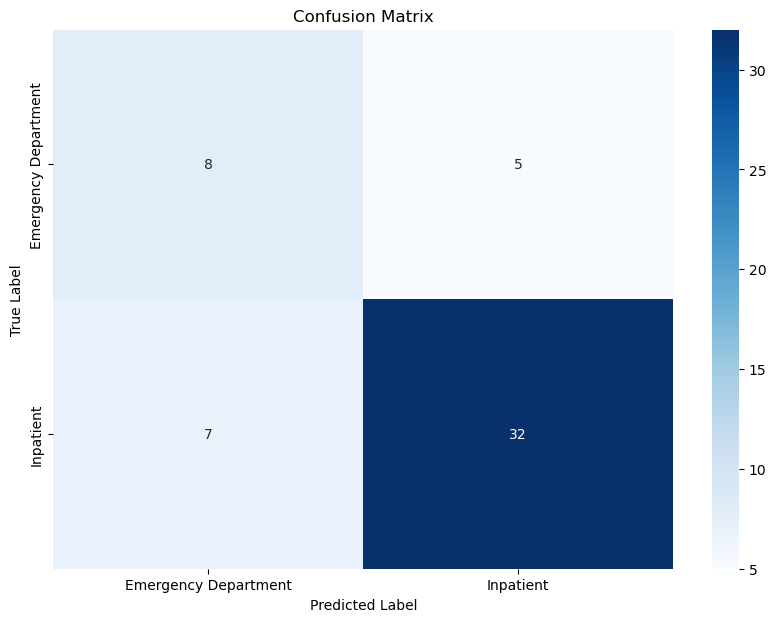

In [22]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder

# Fit the classifier with the training set
dt.fit(data_train, target_train)
 
# Predict on the test set
pred = dt.predict(data_test)
 
# Evaluate the model
accuracy = accuracy_score(target_test, pred)
report = classification_report(target_test, pred, target_names=label_encoder.classes_)
conf_matrix = confusion_matrix(target_test, pred)
 
print(f'Accuracy: {accuracy}')

# True Positives (TP)
TP = conf_matrix[1, 1]
# True Negatives (TN)
TN = conf_matrix[0, 0]
# False Positives (FP)
FP = conf_matrix[0, 1]
# False Negatives (FN)
FN = conf_matrix[1, 0]
# Accuracy excluding True Negatives
accuracy_excl_tn = (TP + FP + FN) / (TP + TN + FP + FN)
print(f'Accuracy (excluding True Negatives): {accuracy_excl_tn}')

print('Classification Report:')
print(report)
print('Confusion Matrix:')
print(conf_matrix)
 
# Plot the confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

The decision tree model was trained with the training set, predictions were made on the test set and the model performance was evaluated. As a result of the evaluation, the accuracy rate of the model, performance metrics and the confusion matrix of the model were calculated. The confusion matrix was visualized to analyze where classification errors were concentrated.

According to the result obtained, the accuracy value appears to be 76%, but the distribution in the data is not balanced. The number of hospitalized patients in the data is considerably higher than the number of patients in the emergency department. Therefore, the accuracy was recalculated by removing the true negative values ​​and it was observed that the accuracy rate increased to 84%. This value indicates that the prediction accuracy in the model is good. and shows that it is reliable.

# 5. Association Analyses

### Frequent Itemsets

Frequent Itemsets is an important method that is responsible for removing frequently occurring events in the data and is used in decision-making processes on information in data analysis(23).

In [23]:
from orangecontrib.associate.fpgrowth import frequent_itemsets
 
# calculate the frequent itemsets

itemsets = dict(frequent_itemsets(DM_normalization[['Intravenous ethanol',
                                            'Fomepizole',
                                            'Dialysis',
                                            'Activated charcoal']].values, 0.01))
 
# store the results in a dataframe
rows = []

for itemset, support_count in itemsets.items():

    domain_names= ",".join([DM_normalization[[ 'Intravenous ethanol',
                                      'Fomepizole',
                                      'Dialysis',
                                      'Activated charcoal']].columns[item_index] for item_index in itemset])

    rows.append((len(itemset), support_count, support_count / len(DM_normalization.index), domain_names))
 
item_set_table = pd.DataFrame(rows, columns=["size", "support count", "support", "items"])

item_set_table.sort_values('support', ascending = False)

item_set_table

,size,support count,support,items
0,1,16,0.061538,Intravenous ethanol
1,1,59,0.226923,Fomepizole
2,2,9,0.034615,"Intravenous ethanol,Fomepizole"
3,1,32,0.123077,Dialysis
4,2,7,0.026923,"Intravenous ethanol,Dialysis"
5,2,23,0.088462,"Fomepizole,Dialysis"
6,3,4,0.015385,"Intravenous ethanol,Fomepizole,Dialysis"
7,1,20,0.076923,Activated charcoal
8,2,5,0.019231,"Intravenous ethanol,Activated charcoal"
9,2,8,0.030769,"Fomepizole,Activated charcoal"


Information about medical treatment methods for patients is mentioned in the data. Treatments applied: **Intravenous ethanol**, **Fomepizole**, **Dialysis**, **Activated charcoal**. Intravenous ethanol therapy is the treatment method used for toxic alcohol poisoning. In this treatment, ethanol prevents methanol and ethylene glycol from producing toxic metabolites by binding with the alcohol dehydrogenase (ADH) enzyme (24). It is a treatment method used especially for methanol and ethylene glycol, and an increase in the Anion gap can be observed during treatment (25). Fomepizole is a drug used in methanol and ethylene glycol poisoning. It prevents the transformation of toxic alcohols into more toxic metabolites by inhibiting the ADH enzyme, and an increase in the Anion gap can be observed during treatment (26) Hemodialysis, one of the methods of dialysis treatment, is used to remove the products formed as a result of methanol and isopropanol poisoning from the blood. Ethylene glucose poisoning may be among the causes of kidney failure. Propylene glycol and acetone are less toxic and do not usually require hemodialysis, but may be helpful in cases of poisoning at high doses (27). Activated charcoal therapy is used to reduce the absorption of toxic substances from the gastrointestinal tract. It is generally not recommended for alcohol poisoning and an increase in anion gap may be observed in the serum/plasma results of people receiving this treatment.

Here, the frequent request set method was applied to find out the frequency of use of medical treatment methods together in patients. Frequent items were calculated with the **fpgrowth** algorithm. Minimum support threshold set to 0.01. The reason why this value is kept small is that there is a significant decrease in the output as you increase the value. As a result, the number of support, support rate and item set for each item set were obtained and a table was created.
When the table is examined, it represents how many items are in the set. Support count shows how many times the itemset appears in the data set. Support indicates the ratio of the number of supports in the data set for the itemset to the total data set size. Items specifies the set of items.
Looking at the values ​​in the table, it is observed that the most used single treatment is fomepizole, and the least used treatment is intravenous ethanol. When we look at the treatments used together with this table, the frequency of use of intravenous ethanol and femopizole treatment with a support value of 0.034 is higher than other groups. This value can be called a medium support value. The second largest support value, 0.030, is seen in the frequency of combined use of fompizole and activated characoal treatment. The frequency of use of all treatments together is quite low (0.01). According to the results, when the frequency of use of the treatments is examined, the support count values ​​are higher for cases of use alone, but the frequency of use together is also included as stated. When this information is supported by literature reviews, the reason why fomepizole and intravenous ethanol treatment are used together more frequently than others may be that both treatments are used in methanol and ethylene glycol poisoning.

### Association Rules

Association rules is a technique used in data mining to define relationships between sets of items in data sets and to predict relationship behaviors for new data (28).

In [24]:
from orangecontrib.associate.fpgrowth import association_rules, rules_stats
 
# calculate association rules from the itemsets
rules = association_rules(itemsets, 0.70)
 
# calculate statistics about the rules and store them in a dataframe
rows = []
for premise, conclusion, sup, conf,cov, strength, lift, leverage  in rules_stats(rules, itemsets, len(DM_normalization)):
    premise_names = ",".join([DM_normalization[[ 'Intravenous ethanol',
                                      'Fomepizole',
                                      'Dialysis',
                                      'Activated charcoal']].columns[item_index] for item_index in premise])
    conclusion_names = ",".join([DM_normalization[[ 'Intravenous ethanol',
                                      'Fomepizole',
                                      'Dialysis',
                                      'Activated charcoal']].columns[item_index] for item_index in conclusion])
    rows.append((premise_names, conclusion_names, sup, conf,cov, strength, lift, leverage))
 
pd.DataFrame(rows, columns = ['Premise', 'Conclusion', 'Support', 'Confidence', 'Coverage', 'Strength', 'Lift', 'Leverage'])

,Premise,Conclusion,Support,Confidence,Coverage,Strength,Lift,Leverage
0,"Fomepizole,Dialysis,Activated charcoal",Intravenous ethanol,3,0.75000,0.015385,4.000000,12.187500,0.010592
1,"Intravenous ethanol,Dialysis,Activated charcoal",Fomepizole,3,1.00000,0.011538,19.666667,4.406780,0.008920
2,"Intravenous ethanol,Fomepizole,Activated charcoal",Dialysis,3,0.75000,0.015385,8.000000,6.093750,0.009645
3,"Intravenous ethanol,Fomepizole,Dialysis",Activated charcoal,3,0.75000,0.015385,5.000000,9.750000,0.010355
4,"Intravenous ethanol,Activated charcoal",Fomepizole,4,0.80000,0.019231,11.800000,3.525424,0.011021
5,"Dialysis,Activated charcoal",Fomepizole,4,0.80000,0.019231,11.800000,3.525424,0.011021
6,Dialysis,Fomepizole,23,0.71875,0.123077,1.843750,3.167373,0.060533


Association rules were calculated from frequent itemsets using the FP-growth algorithm. Statistical calculations regarding the rules were made and the results were examined. The minimum confidence threshold was set to 70%.
When the output is examined, premise represents the elements that form the antecedent of the rule, and conclusion represents the elements that form the conclusion of the rule. Confidence represents the probability that the conclusion will occur if the antecedent occurs. While support represents the frequency of the rule in the data set, covareg contains information about how often the antecedent appears in the data set. Strength indicates the strength of the rule with lift and how much more often the Rule outcome occurs than if the rule occurred independently. Leverage shows the amount of deviation from independence of the rule.
When the results were analyzed, the rule with the highest confidence value was that fomepizole treatment was applied when Intravenous ethanol, Dialysis, Activated charcoal treatments were applied. Considering the frequent itemset results for this situation, it was concluded that fomepizole treatment was the most used treatment, so it was thought that this situation might have an impact on this rule.
Therefore, as a result, when other treatments were considered instead of fomepizole treatment, it was concluded that intravenous ethanol treatment was also used in a patient in whom fomepizole dialysis and activated charcoal treatments were used, with a confidence value of 75% and the highest lift value.

# 6. Regression

The main goal of the regression algorithm is to predict continus variables based on other variables. It fits an equation to a set of data and determines appropriate values ​​to predict the value of y based on a particular value of x, and its basic form, linar regression, is used to show or predict the relationship between two variables or factors (29).
In this study, linear regression and polynomial features were used and the resulting graphs were examined.
In order to see the relationship between the previously selected columns ('Age', 'OG(no ethanol correction)', 'OG(ethanol correction)', 'Estimated osmolal contribution', 'Anion Gap'), graphs were created for each of them.

C:\Users\gulnu\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



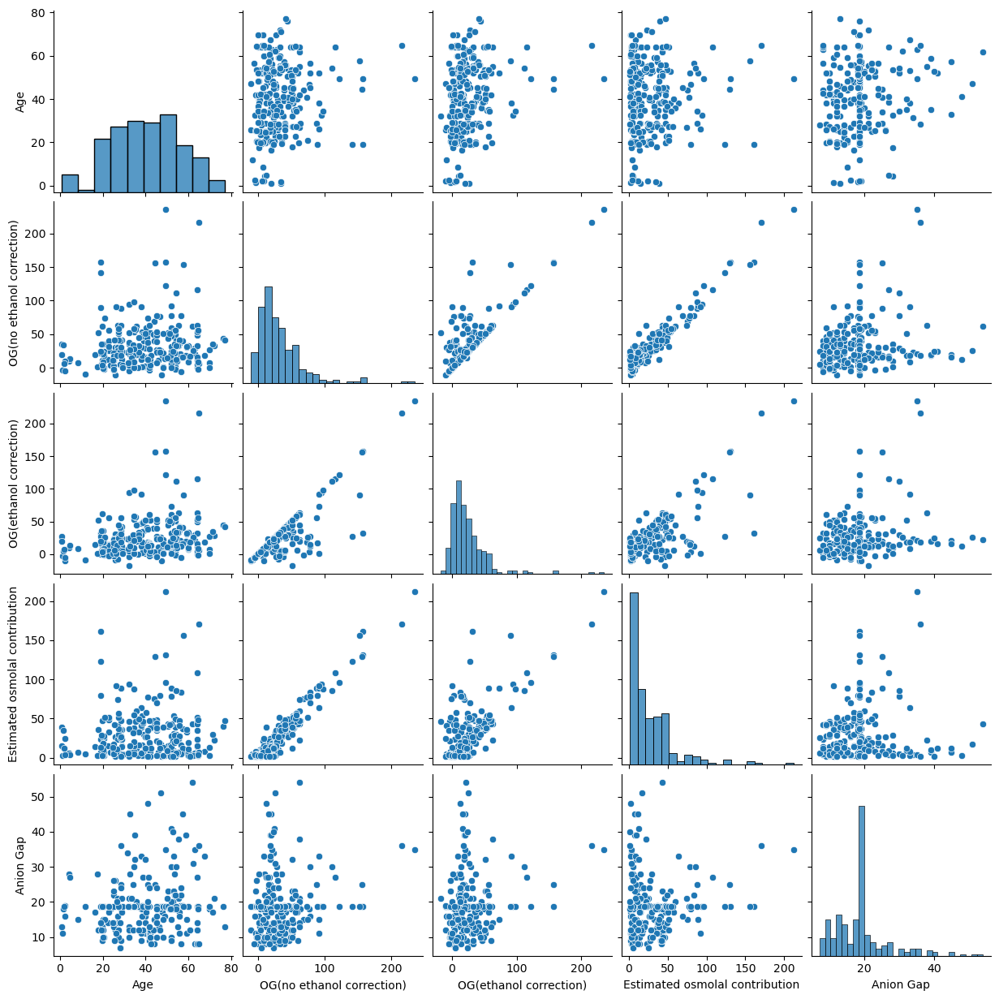

In [25]:
# created plots for each group that selected
sns.pairplot(DM_data_ful[['Age',
    'OG(no ethanol correction)',
    'OG(ethanol correction)', 
    'Estimated osmolal contribution',
    'Anion Gap']])

Then, 3 plots with a linear relationship between them were selected and both linear regression and polynomial features were used on them. RMSE (Root Mean Squared Errors), MSE (Mean Squared Errors), R^2 values ​​were calculated for each graph. RMSE measures the average size of the difference between actual values ​​and predicted values. MSE measures the average square of the differences between actual values ​​and predicted values. R^2 measures the fit between the actual value and the model's predictions.

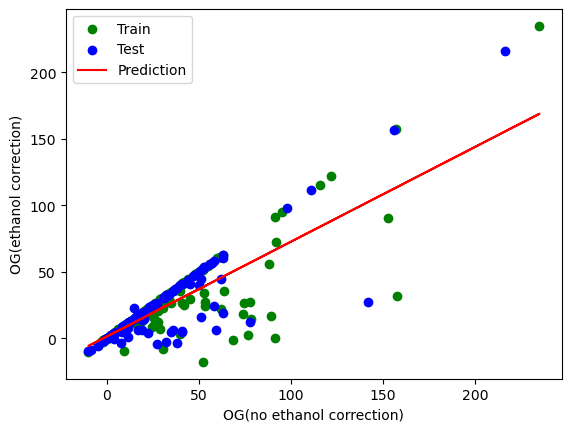

OG(ethanol correction) = 0.71 * OG(no ethanol correction) + 1.48
MSE: 257.48
RMSE: 16.05
R^2: 0.74


In [26]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np

# Features list
features = [
    'Age',
    'OG(no ethanol correction)',
    'OG(ethanol correction)', 
    'Estimated osmolal contribution',
    'Anion Gap'
]

# Separate target variable and arguments
target_variable = 'OG(ethanol correction)'
feature = 'OG(no ethanol correction)'

target = DM_data_ful[target_variable]

# Reshape the argument
features = DM_data_ful[feature].values.reshape(-1, 1)

# Separation into training and testing data sets
features_train, features_test, target_train, target_test = train_test_split(
    features, target, test_size=0.4, random_state=42
)

# Create and train linear regression model
model = LinearRegression()
model.fit(features_train, target_train)


# Predicted values
target_pred_test = model.predict(features_test)

# Plotting original values
plt.scatter(features_train, target_train, c='green', label='Train')
plt.scatter(features_test, target_test, c='blue', label='Test')

# Plotting predicted values
plt.plot(DM_data_ful[feature], model.predict(DM_data_ful[feature].values.reshape(-1, 1)), c='red', label='Prediction')


plt.xlabel('OG(no ethanol correction)')
plt.ylabel('OG(ethanol correction)')
plt.legend()
plt.show()

# Print the model's formula
print("OG(ethanol correction) = {:.2f} * OG(no ethanol correction) + {:.2f}".format(model.coef_[0], model.intercept_))

# Calculate MSE, RMSE and R^2 values
mse = mean_squared_error(target_test, target_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(target_test, target_pred_test)

print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R^2: {r2:.2f}")


The first graph selected is a graphic showing the relationship between osmolal gap (ethanol correction) and osmolal gap (no ethanol correction). As a result of the linear regression applied to this graph, **MSE: 257.48**, **RMSE: 16.05** and **R^2: 0.74**.
When MSE and RMSE values ​​are examined, it can be said that there is a certain margin of error in the model's predictions. However, it should be noted that the range of OG values ​​for this value is wide. There are samples with OG values ​​far from each other in the data. This may occur as an error in these values.
Examining the R^2 Value shows that the model has a very good performance. This shows that the model is successful in predicting the OG(ethanol correction) value using the OG(no ethanol correction) variable.

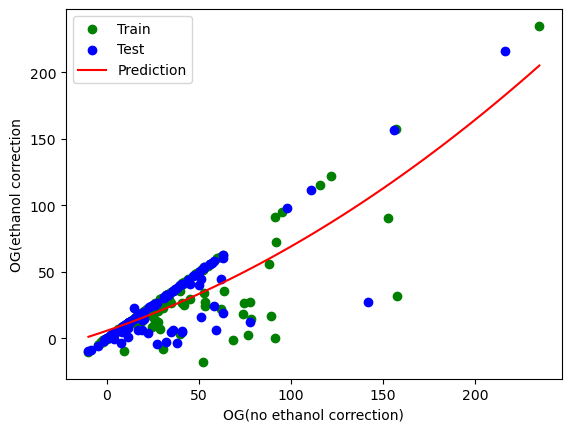

OG(ethanol correction) = 0.47325586230333594*OG(no ethanol correction) + 0.0015945079287330867*OG(no ethanol correction)^2 + 5.818829376756625
MSE: 244.71
RMSE: 15.64
R^2: 0.75


In [27]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

target_variable = 'OG(ethanol correction)'
feature = 'OG(no ethanol correction)'

target = DM_data_ful[target_variable]
features = DM_data_ful[feature].values.reshape(-1, 1)

features_train, features_test, target_train, target_test = train_test_split(
    features, target, test_size=0.4, random_state=42
)
# Create and train PolynomialFeatures and LinearRegression model with Pipeline
degree = 2  # Degree of polynomial
pipeline = Pipeline([
    ('poly', PolynomialFeatures(degree=degree, include_bias=False)),
    ('linear', LinearRegression())
])
pipeline.fit(features_train, target_train)

features_range = np.linspace(features.min(), features.max(), 100).reshape(-1, 1)
prediction_train = pipeline.predict(features_train)
prediction_test = pipeline.predict(features_test)

plt.scatter(features_train, target_train, c='green', label='Train')
plt.scatter(features_test, target_test, c='blue', label='Test')

plt.plot(features_range, pipeline.predict(features_range), c='red', label='Prediction')
plt.xlabel('OG(no ethanol correction)')
plt.ylabel('OG(ethanol correction')
plt.legend()
plt.show()

# Print the model's formula
print(f"{target_variable} = ", end='')
for i, f in enumerate(pipeline.named_steps['poly'].get_feature_names_out([feature])):
    if i > 0:
        print(" + ", end='')
    print(f"{pipeline.named_steps['linear'].coef_[i]}*{f}", end='')
print(f" + {pipeline.named_steps['linear'].intercept_}")


mse = mean_squared_error(target_test, prediction_test)
rmse = np.sqrt(mse)
r2 = r2_score(target_test, prediction_test)

print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R^2: {r2:.2f}")

The values ​​obtained after the polynomial feature applied to the same graph are **MSE: 244.71**, **RMSE: 15.64** and **R^2: 0.75**.
When MSE and RMSE values ​​are examined, it is observed that they are lower than the linear regression model, in which case it can be said that it makes more accurate predictions. R^2 value is 0.01% higher than linear regression. This difference is quite small, but it can be interpreted that the model fits the variance better.

When the two graphs are examined, it can be said that the model created with polynomial feature is more successful than the linear regression model. When looking at this graph, it can be interpreted that the points below the linear line have an impact on the data prediction and the polynomial prediction line captures them better.

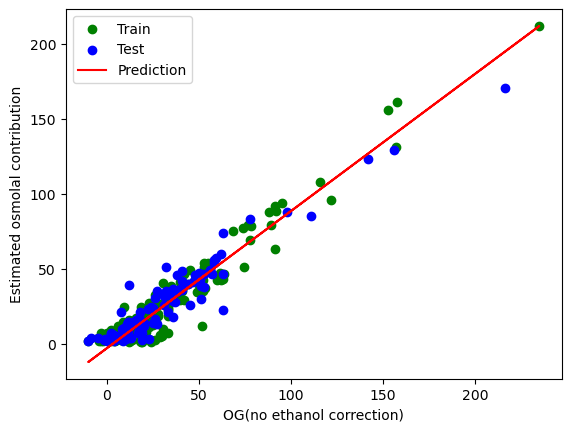

Estimated osmolal contribution = 0.91 * OG(no ethanol correction) + -2.73
MSE: 80.25
RMSE: 8.96
R^2: 0.90


In [28]:

target_variable = 'Estimated osmolal contribution'
feature = 'OG(no ethanol correction)'
target = DM_data_ful[target_variable]

features = DM_data_ful[feature].values.reshape(-1, 1)

features_train, features_test, target_train, target_test = train_test_split(
    features, target, test_size=0.4, random_state=42
)

model = LinearRegression()
model.fit(features_train, target_train)

target_pred_train = model.predict(features_train)
target_pred_test = model.predict(features_test)

plt.scatter(features_train, target_train, c='green', label='Train')
plt.scatter(features_test, target_test, c='blue', label='Test')

plt.plot(DM_data_ful[feature], model.predict(DM_data_ful[feature].values.reshape(-1, 1)), c='red', label='Prediction')

plt.xlabel('OG(no ethanol correction)')
plt.ylabel('Estimated osmolal contribution')
plt.legend()
plt.show()

print("Estimated osmolal contribution = {:.2f} * OG(no ethanol correction) + {:.2f}".format(model.coef_[0], model.intercept_))

mse = mean_squared_error(target_test, target_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(target_test, target_pred_test)

print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R^2: {r2:.2f}")


The second selected chart is the estimated osmolal contribution and osmolal gap (no ethanol correction) values. As a result of the linear regression applied to this graph, **MSE: 80.25**, **RMSE: 8.96** and **R^2: 0.90**.
When MSE and RMSE values ​​are examined, it is observed that they are quite low and indicate that the prediction errors of the model are small.
When R^2 values ​​are examined, they are quite high, meaning that the model explains a large part of the variance in the data.
These values ​​are estimated values ​​on the osmolal gap before ethanol correction, and it can be interpreted from the graph that the relationship between these two values ​​is quite linear.

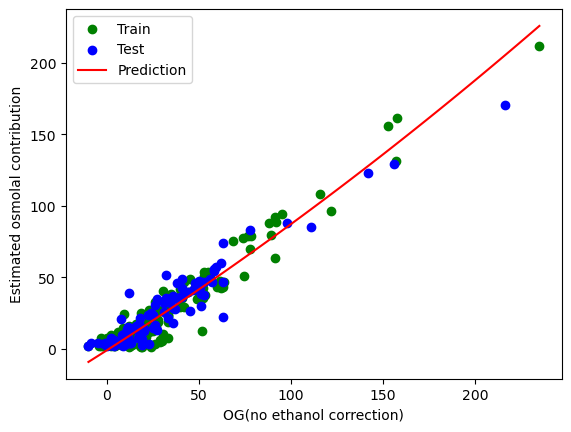

Estimated osmolal contribution = 0.8208538154748425*OG(no ethanol correction) + 0.0006162438383208463*OG(no ethanol correction)^2 + -1.0574249504038349
MSE: 83.54
RMSE: 9.14
R^2: 0.90


In [29]:
target_variable = 'Estimated osmolal contribution'
feature = 'OG(no ethanol correction)'
target = DM_data_ful[target_variable]

features = DM_data_ful[feature].values.reshape(-1, 1)

features_train, features_test, target_train, target_test = train_test_split(
    features, target, test_size=0.4, random_state=42
)

degree = 2  
pipeline = Pipeline([
    ('poly', PolynomialFeatures(degree=degree, include_bias=False)),
    ('linear', LinearRegression())
])
pipeline.fit(features_train, target_train)

features_range = np.linspace(features.min(), features.max(), 100).reshape(-1, 1)
prediction_train = pipeline.predict(features_train)
prediction_test = pipeline.predict(features_test)

plt.scatter(features_train, target_train, c='green', label='Train')
plt.scatter(features_test, target_test, c='blue', label='Test')

plt.plot(features_range, pipeline.predict(features_range), c='red', label='Prediction')
plt.xlabel('OG(no ethanol correction)')
plt.ylabel('Estimated osmolal contribution')
plt.legend()
plt.show()

print(f"{target_variable} = ", end='')
for i, f in enumerate(pipeline.named_steps['poly'].get_feature_names_out([feature])):
    if i > 0:
        print(" + ", end='')
    print(f"{pipeline.named_steps['linear'].coef_[i]}*{f}", end='')
print(f" + {pipeline.named_steps['linear'].intercept_}")


mse = mean_squared_error(target_test, prediction_test)
rmse = np.sqrt(mse)
r2 = r2_score(target_test, prediction_test)

print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R^2: {r2:.2f}")


The values ​​obtained after the polynomial feature applied to the same graph are **MSE: 83.54**, **RMSE: 9.14** and **R^2: 0.90**.
When the MSE and RMSE values ​​were examined, it was observed that the MSE and RMSE values ​​of the polynomial model were slightly higher than those of the linear model. In this case, it can be said that the errors of the polynomial model are slightly larger than the linear model.
R^2 values ​​of both models are the same, both models explain 90% of the variance.
Both models perform quite well, but it can be said that the linear model is more successful because the RMSE and MSE values ​​in the linear model are slightly lower.

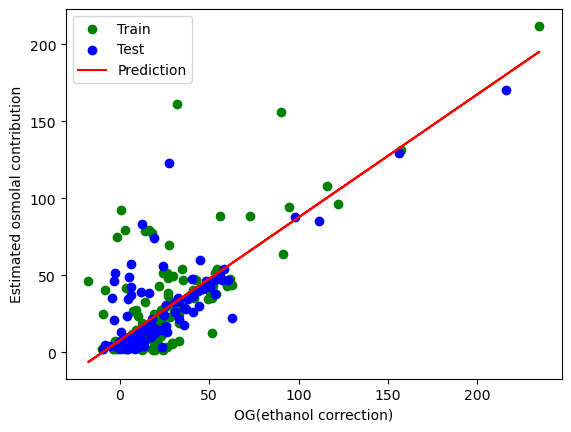

Estimated osmolal contribution = 0.80 * OG(ethanol correction)) + 7.72
MSE: 335.26
RMSE: 18.31
R^2: 0.58


In [30]:

target_variable = 'Estimated osmolal contribution'
feature = 'OG(ethanol correction)'

target = DM_data_ful[target_variable]

features = DM_data_ful[feature].values.reshape(-1, 1)

features_train, features_test, target_train, target_test = train_test_split(
    features, target, test_size=0.4, random_state=42
)

model = LinearRegression()
model.fit(features_train, target_train)

target_pred_train = model.predict(features_train)
target_pred_test = model.predict(features_test)

plt.scatter(features_train, target_train, c='green', label='Train')
plt.scatter(features_test, target_test, c='blue', label='Test')

plt.plot(DM_data_ful[feature], model.predict(DM_data_ful[feature].values.reshape(-1, 1)), c='red', label='Prediction')

plt.xlabel('OG(ethanol correction)')
plt.ylabel('Estimated osmolal contribution')
plt.legend()
plt.show()

print("Estimated osmolal contribution = {:.2f} * OG(ethanol correction)) + {:.2f}".format(model.coef_[0], model.intercept_))

mse = mean_squared_error(target_test, target_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(target_test, target_pred_test)

print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R^2: {r2:.2f}")


The third selected graph is the estimated osmolal contribution and osmolal gap (ethanol correction) values. As a result of the linear regression applied to this graph, **MSE: 335.26**, **RMSE: 18.31** and **R^2: 0.58**.
When MSE and RMSE values ​​are examined, it is observed that the values ​​are quite large. In this case, it can be said that the prediction errors of the model are quite large.
When the R^2 value is examined, it is observed that it is a very low value and it can be said that it does not explain the variance of the model well and provides a low fit.
The graph of the osmolal gap values ​​before ethanol correction and the predicted values ​​in the previous one is more successful than this graph. In this case, it can be interpreted that when the correction is made, the linear relationship between the osmolal gap and the predicted values ​​is slightly disrupted.

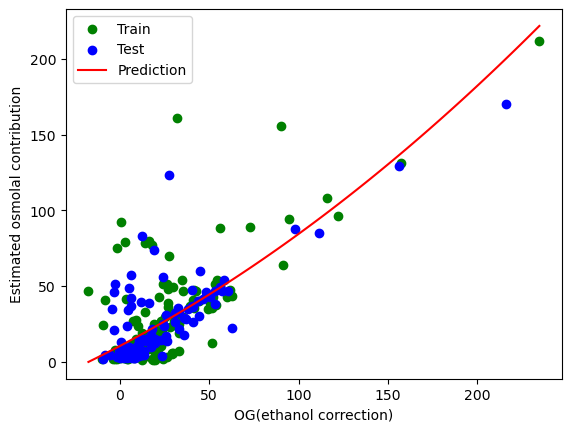

Estimated osmolal contribution = 0.6206796626329222*OG(ethanol correction) + 0.0011915230007915952*OG(ethanol correction)^2 + 10.398124025865801
MSE: 331.16
RMSE: 18.20
R^2: 0.59


In [31]:

target_variable = 'Estimated osmolal contribution'
feature = 'OG(ethanol correction)'

target = DM_data_ful[target_variable]

features = DM_data_ful[feature].values.reshape(-1, 1)


features_train, features_test, target_train, target_test = train_test_split(
    features, target, test_size=0.4, random_state=42
)

degree = 2 
pipeline = Pipeline([
    ('poly', PolynomialFeatures(degree=degree, include_bias=False)),
    ('linear', LinearRegression())
])
pipeline.fit(features_train, target_train)

features_range = np.linspace(features.min(), features.max(), 100).reshape(-1, 1)
prediction_train = pipeline.predict(features_train)
prediction_test = pipeline.predict(features_test)

plt.scatter(features_train, target_train, c='green', label='Train')
plt.scatter(features_test, target_test, c='blue', label='Test')

plt.plot(features_range, pipeline.predict(features_range), c='red', label='Prediction')
plt.xlabel('OG(ethanol correction)')
plt.ylabel('Estimated osmolal contribution')
plt.legend()
plt.show()

print(f"{target_variable} = ", end='')
for i, f in enumerate(pipeline.named_steps['poly'].get_feature_names_out([feature])):
    if i > 0:
        print(" + ", end='')
    print(f"{pipeline.named_steps['linear'].coef_[i]}*{f}", end='')
print(f" + {pipeline.named_steps['linear'].intercept_}")

target_pred_train = model.predict(features_train)
target_pred_test = model.predict(features_test)

mse = mean_squared_error(target_test, prediction_test)
rmse = np.sqrt(mse)
r2 = r2_score(target_test, prediction_test)

print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R^2: {r2:.2f}")


The values ​​obtained after the polynomial feature applied to the same graph are **MSE: 331.16**, **RMSE: 18.20** and **R^2: 0.59**.
When the MSE and RMSE values ​​are examined, it can be said that it is slightly lower than the linear model, that is, it has a lower error rate than the linear model.
The R^2 value is also slightly higher than the linear equation. As a result of comparing these two graphs, it can be said that the polynomial graph is more successful, but in general the graph values ​​are quite low. It is seen that the error rate is high and the explanation value of the variance is low. This may indicate that both models are not sufficient to predict the Estimated osmolal contribution value using OG(ethanol correction).

### REFERENCES


1.  Zhang, Y., & Kwong, T. C. (2014). Utilization management in toxicology. Clinica Chimica Acta, 427, 158-166.
2. Greene, H. R., & Krasowski, M. D. (2020). Correlation of osmolal gap with measured concentrations of acetone, ethylene glycol, isopropanol, methanol, and propylene glycol in patients at an academic medical center. Toxicology reports, 7, 81-88.
3. Prevost, M., Sun, Y., Servilla, K. S., Massie, L., Glew, R. H., & Tzamaloukas, A. H. (2012). Repeated intoxication presenting with azotemia, elevated serum osmolal gap, and metabolic acidosis with high anion gap: differential diagnosis, management, and prognosis. International urology and nephrology, 44, 309-314.
4. Kraut, J. A. (2015). Diagnosis of toxic alcohols: limitations of present methods. Clinical Toxicology, 53(7), 589-595.
5. Kraut, J. A., & Kurtz, I. (2008). Toxic alcohol ingestions: clinical features, diagnosis, and management. Clinical Journal of the American Society of Nephrology, 3(1), 208-225.
6. Kraut, J. A., & Xing, S. X. (2011). Approach to the evaluation of a patient with an increased serum osmolal gap and high-anion-gap metabolic acidosis. American journal of kidney diseases, 58(3), 480-484.
7.  Enger, E. (1982). Acidosis, gaps and poisonings. Acta Medica Scandinavica, 212(1‐2), 1-3.
8. Ayesha, S., Hanif, M., & Talib, R. (2020). Overview and comparative study of dimensionality reduction techniques for high dimensionality data. Information Fusion, 59, 44–58.
9. Singh, D., & Singh, B. (2020). Investigating the impact of data normalization on classification performance. Applied Soft Computing, 97, 105524.
10. Dahouda, M. K., & Joe, I. (2021). A deep-learned embedding technique for categorical features encoding. IEEE Access, 9, 114381-114391.
11. Abdi, H., & Williams, L. J. (2010). Principal component analysis. Wiley interdisciplinary reviews: computational statistics, 2(4), 433-459.
12. Devassy, B. M., & George, S. (2020). Dimensionality reduction and visualisation of hyperspectral ink data using t-SNE. Forensic science international, 311, 110194.
13. Van der Maaten, L., & Hinton, G. (2008). Visualizing data using t-SNE. Journal of machine learning research, 9(11).
14. McInnes, L., Healy, J., & Melville, J. (2018). Umap: Uniform manifold approximation and projection for dimension reduction. arXiv preprint arXiv:1802.03426.
15. Azzag, H., Venturini, G., Oliver, A., & Guinot, C. (2007). A hierarchical ant based clustering algorithm and its use in three real-world applications. European Journal of Operational Research, 179(3), 906-922.
16. Wei, X., Zhang, Z., Huang, H., & Zhou, Y. (2024). An overview on deep clustering. Neurocomputing, 127761.
17. Strauss, T., & Von Maltitz, M. J. (2017). Generalising Ward’s method for use with Manhattan distances. PloS one, 12(1), e0168288.
18. Gere, A. (2023). Recommendations for validating hierarchical clustering in consumer sensory projects. Current Research in Food Science, 6, 100522.
19. Loriaux, D., Bergin, S. P., Patel, S. M., Tucker, J., & Barkauskas, C. E. (2019). Ethylene glycol toxicity in the setting of recurrent ingestion: a case report and literature review. Cureus, 11(4).
20. Cunningham, C. A., Ku, K., & Sue, G. R. (2015). Propylene glycol poisoning from excess whiskey ingestion: a case of high osmolal gap metabolic acidosis. Journal of investigative medicine high impact case reports, 3(3)
21. Prevost, M., Sun, Y., Servilla, K. S., Massie, L., Glew, R. H., & Tzamaloukas, A. H. (2012). Repeated intoxication presenting with azotemia, elevated serum osmolal gap, and metabolic acidosis with high anion gap: differential diagnosis, management, and prognosis. International urology and nephrology, 44, 309-314.,2232
22. Rigatti, S. J. (2017). Random forest. Journal of Insurance Medicine, 47(1), 31-39.r23ogy, 44, 309-314.
23. Luna, J. M., Fournier‐Viger, P., & Ventura, S. (2019). Frequent itemset mining: A 25 years review. Wiley Interdisciplinary Reviews: Data Mining and Knowledge Dis24very, 9(6), e1329.
24. DiPaula, B., Tommasello, A., Solounias, B., & McDuff, D. (1998). An evaluation of intravenous ethanol in hospitalized patients. Journal of substance abuse treat25nt, 15(5), 437-442.
25. Liontos, A., Samanidou, V., Athanasiou, L., Filippas-Ntekouan, S., Milionis, C., Samanidou Jr, V., & Athanasiou, L. E. (2023). Acute Ethanol Intoxication: Αn Overlooked Cause of High Anion Gap Metabolic Acidosis With a Marked Increase in Serum Osmol26 Gap. Cureus, 15(4).
26. Mégarbane, B., Borron, S. W., Trout, H., Hantson, P., Jaeger, A., Krencker, E., ... & Baud, F. J. (2001). Treatment of acute methanol poisoning with fomepizole. Intensive care m27icine, 27, 1370-1378.
27. Berendt, R. C., Passerini, L., Legatt, D., Dinwoodie, A., & King, E. G. (1987). Severe methanol intoxication: Methanol pharmacokinetics and serum osmolality. Journal of criti28l care, 2(3), 181-186.
28. Zhang, S., & Wu, X. (2011). Fundamentals of association rules in data mining and knowledge discovery. Wiley Interdisciplinary Reviews: Data Mining and Knowledge29iscovery, 1(2), 97-116.
29. Gupta, S. (2015). A regression modeling technique on data mining. International Journal of Computer Applications, 116(9)